In [87]:
# Data
import numpy
import PIL.ImageDraw
image_path = 'paintings/0.png'
image_height_mm = 970

baguette_path = 'baguettes/0.jpg'
baguette_height_mm = 93

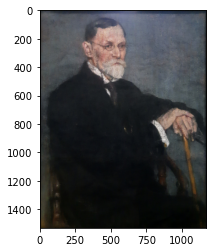

In [88]:
from matplotlib.pyplot import imshow
import numpy as np
from PIL import Image, ImageDraw

painting = Image.open(image_path, 'r')
imshow(np.asarray(painting))

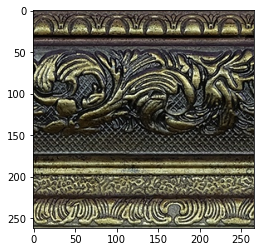

In [89]:
baguette = Image.open(baguette_path, 'r')
imshow(np.asarray(baguette))

In [90]:
baguette_real_scale = image_height_mm / baguette_height_mm
baguette_real_scale

10.43010752688172

In [91]:
baguette_image_scale = painting.height / baguette.height
baguette_image_scale

5.843511450381679

In [92]:
baguette_scale = baguette_image_scale / baguette_real_scale
baguette_scale

0.5602541906036043

In [93]:
baguette_scaled = baguette.resize((int(baguette.width * baguette_scale), int(baguette.height * baguette_scale)))
baguette_scaled.size

(149, 146)

# Get Rotated Baguette

In [94]:
baguette_n = baguette_scaled
baguette_w = baguette_scaled.rotate(90)
baguette_s = baguette_scaled.rotate(180)
baguette_e = baguette_scaled.rotate(270)

In [95]:
result_width = baguette_w.width + painting.width + baguette_e.width
result_height = baguette_n.height + painting.height + baguette_s.height
result_width, result_height

(1469, 1823)

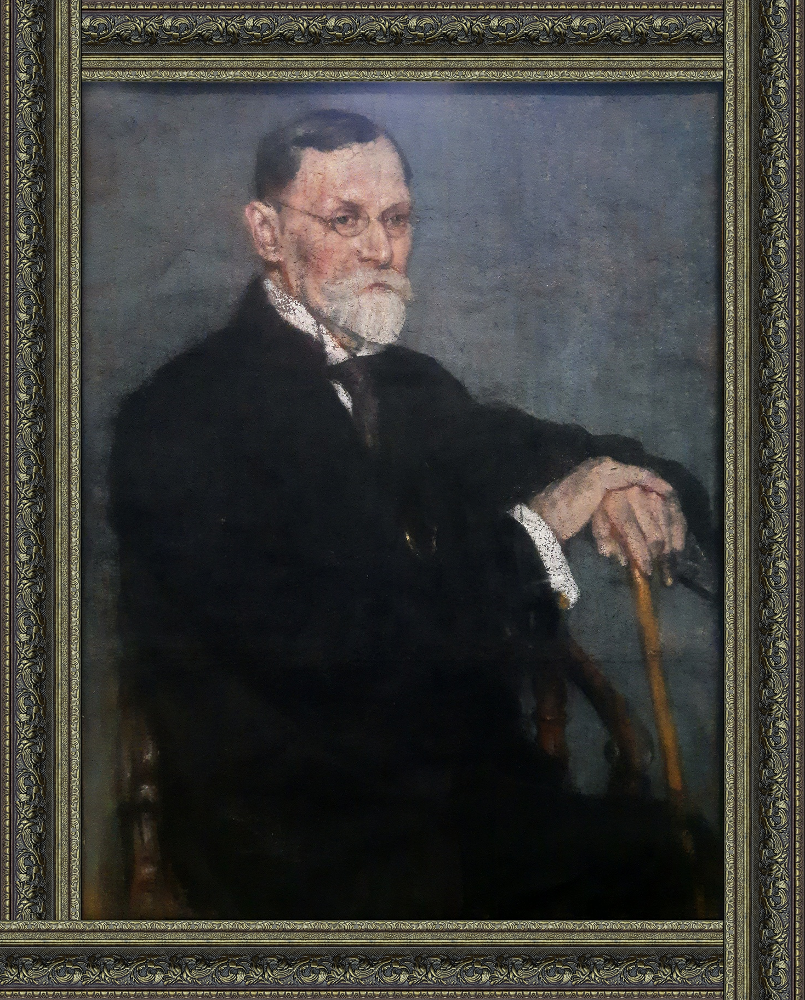

In [96]:
result = Image.new('RGB', (result_width, result_height))
result.paste(baguette_n)

for i in range(int(result_width / baguette_n.width)):
    result.paste(baguette_n, (i * baguette_n.width, 0))

for i in range(int(result_height / baguette_w.height)):
    result.paste(baguette_w, (0, i * baguette_w.height))

for i in range(int(result_width / baguette_s.width)):
    result.paste(baguette_s, (i * baguette_s.width, result_height - baguette_s.height))

for i in range(int(result_height / baguette_e.height) + 1):
    result.paste(baguette_e, (result_width - baguette_e.width, i * baguette_e.height))

result.paste(painting, (baguette_e.width, baguette_n.height))

result

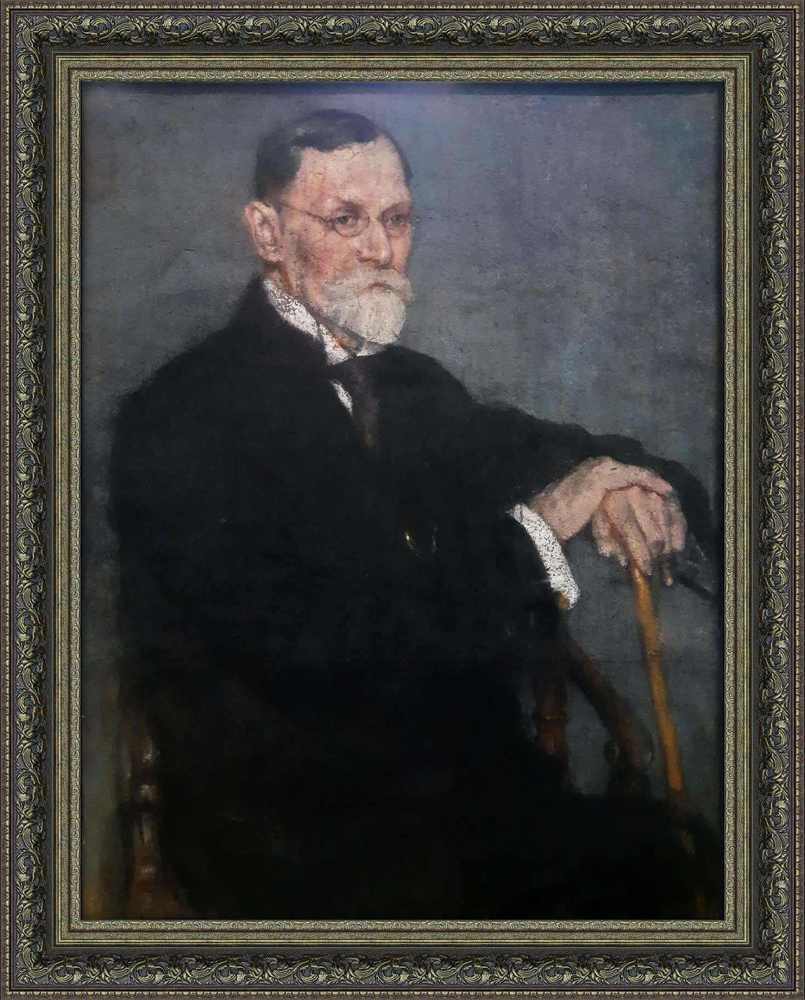

In [97]:
def nw(image):
    return [(0,0), (image.width, 0) ,(image.width, image.height)]

def sw(image):
    return [(0, image.height), (image.width, 0) ,(image.width, image.height)]

def se(image):
    return [(0,0), (0, image.height) ,(image.width, image.height)]

def ne(image):
    return [(0,0), (0, image.height), (image.height, 0)]


# Fill corners properly
def triangle_cut(image, pos='nw'):
    image_array = numpy.asarray(image.convert('RGBA'))

    if pos == 'nw':
        polygon = nw(image)
    if pos == 'sw':
        polygon = sw(image)
    if pos == 'se':
        polygon = se(image)
    if pos == 'ne':
        polygon = ne(image)

    maskIm = Image.new('L', (image_array.shape[1], image_array.shape[0]), 0)
    ImageDraw.Draw(maskIm).polygon(polygon, outline=1, fill=1)
    mask = numpy.array(maskIm)

    # assemble new image (uint8: 0-255)
    newImArray = numpy.empty(image_array.shape, dtype='uint8')

    # colors (three first columns, RGB)
    newImArray[:,:,:3] = image_array[:,:,:3]

    # transparency (4th column)
    newImArray[:,:,3] = mask * 255

    # back to Image from numpy
    return Image.fromarray(newImArray, 'RGBA')

def fill_corner(baguette, corner, coordinates):
    baguette_corner = triangle_cut(baguette, corner)
    result.paste(baguette_corner, coordinates, baguette_corner)

fill_corner(baguette_n.copy(), 'nw', (0, 0))
fill_corner(baguette_w.copy(), 'ne', (0, result.height - baguette_w.height))
fill_corner(baguette_s.copy(), 'se', (result.width - baguette_s.width, result.height - baguette_s.height))
fill_corner(baguette_n.copy(), 'ne', (result.width - baguette_n.width, 0))

result